<a href="https://colab.research.google.com/github/haleywis/OPTI556/blob/main/556_FinalProj_Wiskoski.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# OPTI-556: Final Project 
# Coded Aperture Projection Tomography 

Haley Wiskoski 
University of Arizona



# Libraries

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
from scipy import signal
from scipy import integrate
from scipy.ndimage.interpolation import rotate
from scipy.spatial.transform import Rotation as R
from skimage.transform import radon, rescale,  resize, warp
from scipy import interpolate
from skimage.transform import iradon_sart
%matplotlib inline
plt.rcParams['figure.figsize'] = [30, 10]
plt.rcParams.update({'font.size': 22})
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import layers
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.models import Model
import cv2
from keras.datasets import mnist
from progressbar import ProgressBar

# 1.) Small-Scale Tests

## Loading and prepping data  
In this project, we will use the MNIST dataset of handwritten characters. In this section, we also create our forward model, H, with the embedded random coded aperture. To obtain projections along various angles of the object, we will utilize the single forward projection model and apply it iteratively to a rotated image for a defined number of projections. 

In [ ]:
# Loading test images (28x28 image size)
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = np.pad(x_train, ((0,0),(6,6),(6,6)), 'constant')
x_test =np.pad(x_test, ((0,0),(6,6),(6,6)), 'constant')
x_train=x_train.astype("float32")/255.0
x_test=x_test.astype("float32")/255.0


11501568/11490434 [==============================] - 0s 0us/step


In [ ]:
# Creating the forward model, H
# NOTE: l is object distance from the coded aperture in waves, delta is the 
#       spacing between object elements, d is the distance from the detector,
#       N is the size of our square test image, M is the length of the coded
#       aperture & height of the forward model matrix

l= 10
delta=1
N=40
M=192
pbar1 = ProgressBar()

code=np.random.randint(0,2,M)
def t(x):
  t=code[np.int(np.floor((x+M/2)/delta))]
  return t
vt=np.vectorize(t)
def p(j):
  xj, yj=delta*divmod(j,N)
  xj=xj-N*delta/2
  yj=yj+l
  return xj, yj
def g(j,x):
  g=t((x+(l/p(j)[1])*p(j)[0])/(1+(l/p(j)[1])))
  return g
def h(i,j):
  h=integrate.quad(lambda x: g(j,x), (i-M/2)*delta-delta/2,(i-M/2)*delta +delta/2)[0]
  return h
H=np.zeros((M,N**2))

for j in pbar1(range(N**2)):
  for i in range(M):
    H[i,j]=h(i,j)

100% (1600 of 1600) |####################| Elapsed Time: 0:04:39 Time:  0:04:39


As can be seen below, the coded aperture spans a 192 x 1 array, where it shows a value of 1 for areas of transmission, and 0 for opaque areas blocking transmission. 

The discrete object in question is sized 28 x 28, but padded to 40x40, resulting in 1600 object elements for a delta = 1. Each column of H shown below depicts 1600 object element projections through the 192 element coded aperture (192 measurments), onto a single pixel of the detector. For 192 measurements of the object, we obtain a forward model sized 192 x 1600 (measurements by # of pixels). 

Text(0.5, 1.0, 'Initial Forward Model, H')

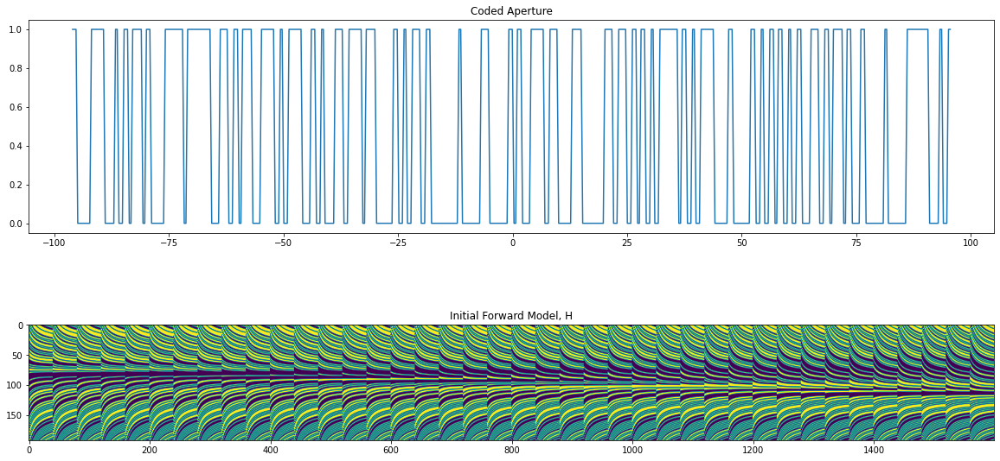

In [ ]:
# Displaying coded aperture and initial forward model 
xspace = np.linspace(-M*delta/2, (M-1)*delta/2, 512)
plt.rcParams['figure.figsize'] = [20,10]
plt.subplot(2,1,1)
plt.plot(xspace,vt(xspace))
plt.title('Coded Aperture')
plt.subplot(2,1,2)
plt.imshow(H)
plt.title('Initial Forward Model, H')


## Image Rotation, Single Forward Model

Here we test rotating images and applying the single forward model to the rotations.

Below we have the result of a rotated forward matrix. We reshape the initial forward model, maintaining how the data is read, to be compatible with a 2x2 rotational matrix. The two matrices are multiplied and the result is reshaped to its original dimensionality.

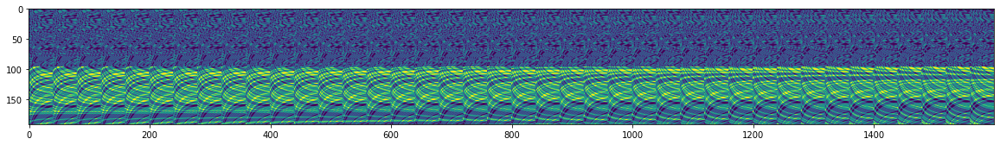

In [ ]:
theta = np.radians(45)
c, s = np.cos(theta), np.sin(theta)
R = np.array(((c, -s), (s, c)))

H45_test = np.reshape(H,(2,153600))
H45_test = np.dot(R,H45_test)
H45_test=np.reshape(H45_test,(192,1600))

plt.imshow(np.abs(H45_test))

Text(0.5, 1.0, 'H0 on Unrotated Obj')

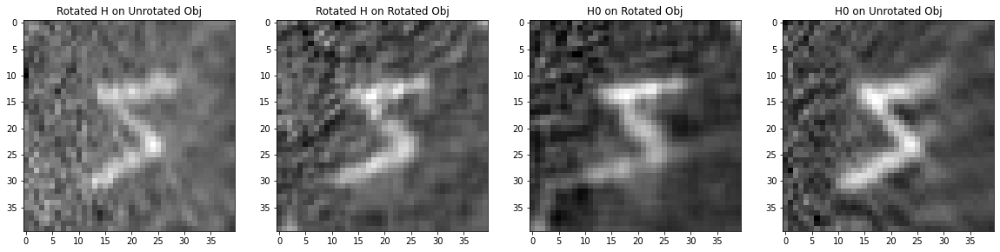

In [ ]:
# Some results
Imgrot_test1 = rotate(x_train[0,:,:], angle = 45, reshape = False)

H45_test = np.reshape(np.matmul(np.linalg.pinv(np.abs(H45_test)),np.matmul(np.abs(H45_test),np.reshape(x_train[0],N**2))),(N,N))

Htest45 = np.reshape(np.matmul(np.linalg.pinv(H45),np.matmul(H45,np.reshape(Imgrot_test1,N**2))),(N,N))
Htest45 = rotate(Htest45, angle = -45, reshape = False, mode='mirror')

H_rot1 = np.reshape(np.matmul(np.linalg.pinv(H),np.matmul(H,np.reshape(Imgrot_test1,N**2))),(N,N))
H_rot1 = rotate(H_rot1, angle = -45, reshape = False, mode = 'mirror')

H0 = np.reshape(np.matmul(np.linalg.pinv(H),np.matmul(H,np.reshape(x_train[0,:,:],N**2))),(N,N))

plt.subplot(1,4,1)
plt.imshow(H45_test,cmap='gray')
plt.title('Rotated H on Unrotated Obj')
plt.subplot(1,4,2)
plt.imshow(Htest45, cmap = 'gray')
plt.title('Rotated H on Rotated Obj')
plt.subplot(1,4,3)
plt.imshow(H_rot1, cmap = 'gray')
plt.title('H0 on Rotated Obj')
plt.subplot(1,4,4)
plt.imshow(H0, cmap = 'gray')
plt.title('H0 on Unrotated Obj')

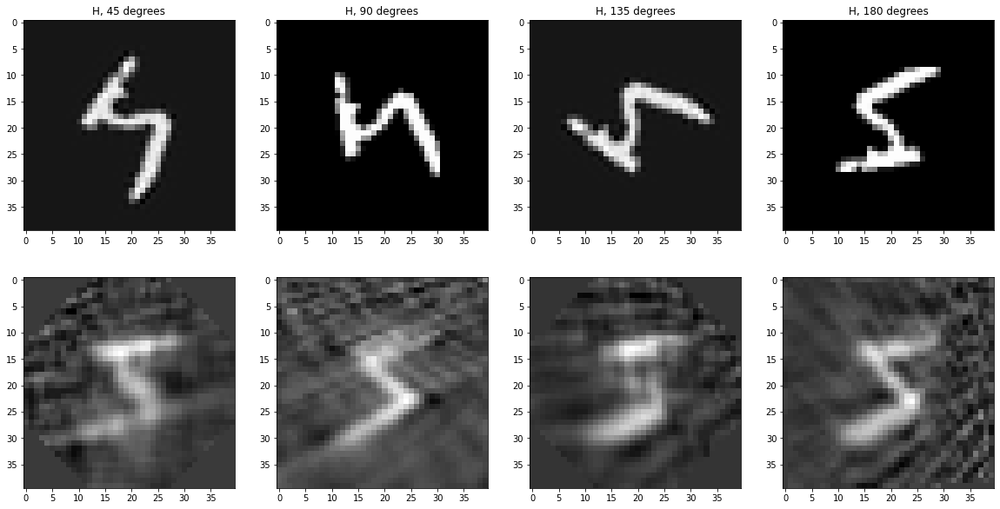

In [ ]:
# Image rotation and unrotated forward model application demonstration

Imgrot_test1 = rotate(x_train[0,:,:], angle = 45, reshape = False)
Imgrot_test2 = rotate(x_train[0,:,:], angle = 90, reshape = False)
Imgrot_test3 = rotate(x_train[0,:,:], angle = 135, reshape = False)
Imgrot_test4 = rotate(x_train[0,:,:], angle = 180, reshape = False)

H0 = np.reshape(np.matmul(np.linalg.pinv(H),np.matmul(H,np.reshape(x_train[0,:,:],N**2))),(N,N))
H_rot1 = np.reshape(np.matmul(np.linalg.pinv(H),np.matmul(H,np.reshape(Imgrot_test1,N**2))),(N,N))
H_rot2 = np.reshape(np.matmul(np.linalg.pinv(H),np.matmul(H,np.reshape(Imgrot_test2,N**2))),(N,N))
H_rot3 = np.reshape(np.matmul(np.linalg.pinv(H),np.matmul(H,np.reshape(Imgrot_test3,N**2))),(N,N))
H_rot4 = np.reshape(np.matmul(np.linalg.pinv(H),np.matmul(H,np.reshape(Imgrot_test4,N**2))),(N,N))

plt.subplot(2,4,1)
plt.imshow(Imgrot_test1, cmap = 'gray')
plt.title('H, 45 degrees')
plt.subplot(2,4,2)
plt.imshow(Imgrot_test2, cmap = 'gray')
plt.title('H, 90 degrees')
plt.subplot(2,4,3)
plt.imshow(Imgrot_test3, cmap = 'gray')
plt.title('H, 135 degrees')
plt.subplot(2,4, 4)
plt.imshow(Imgrot_test4, cmap = 'gray')
plt.title('H, 180 degrees')
plt.subplot(2,4,5)
H_rot1 = rotate(H_rot1, angle = -45, reshape = False)
plt.imshow(H_rot1, cmap = 'gray')
plt.subplot(2,4,6)
H_rot2 = rotate(H_rot2, angle = -90, reshape = False)
plt.imshow(H_rot2, cmap = 'gray')
plt.subplot(2,4,7)
H_rot3 = rotate(H_rot3, angle = -135, reshape = False)
plt.imshow(H_rot3, cmap = 'gray')
plt.subplot(2,4,8)
H_rot4 = rotate(H_rot4, angle = -180, reshape = False)
plt.imshow(H_rot4, cmap = 'gray')

We can see in the above projections that some of the rotations will cause clipping at the image edges. The above images show the results of zero-padding the object prior to rotation; if it is not padded the central object can be cut off by rotation. Below, we demonstrate the performance of four different boundary modes for the rotation function, and determine that the 'mirror' mode most accurately reflects the data at the corners of an unrotated or unclipped projection. 'Nearest' mode creates a smearing effect that does not depict the noise level that would occur in the projection, and 'wrap' mode essentially creates a blurred version of the image in the corners, also not depocting the noise level in the projection. 'Reflect' and 'mirror' most resemble what would exist in the corners of the projection had they not been clipped off due to rotation. As these corners of the projections don't contain important data of the central object, this is a reasonable approach to mitigating the effects. 

Text(0.5, 1.0, 'Wrap mode')

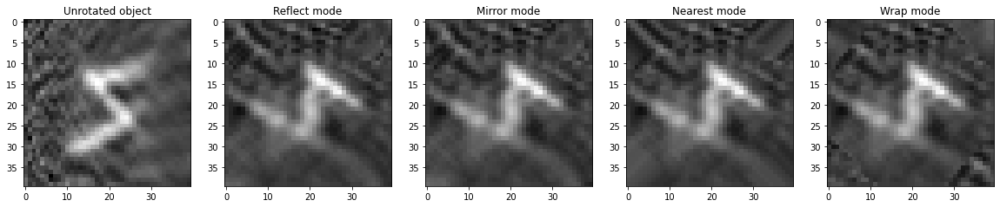

In [ ]:
plt.subplot(1,5,1)
plt.imshow(H0, cmap = 'gray')
plt.title('Unrotated object')
plt.subplot(1,5,2)
plt.imshow(rotate(H_rot1, angle = -45, reshape = False, mode = 'reflect'), cmap = 'gray')
plt.title('Reflect mode')
plt.subplot(1,5,3)
plt.imshow(rotate(H_rot1, angle = -45, reshape = False, mode = 'mirror'), cmap = 'gray')
plt.title('Mirror mode')
plt.subplot(1,5,4)
plt.imshow(rotate(H_rot1, angle = -45, reshape = False, mode = 'nearest'), cmap = 'gray')
plt.title('Nearest mode')
plt.subplot(1,5,5)
plt.imshow(rotate(H_rot1, angle = -45, reshape = False, mode = 'wrap'), cmap = 'gray')
plt.title('Wrap mode')

Text(0.5, 1.0, '180 deg')

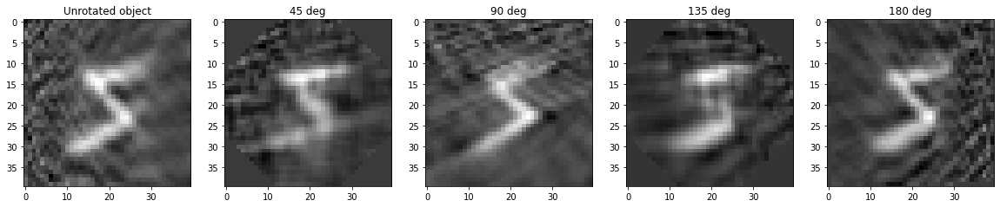

In [ ]:
# mirror mode on several rotations to check
plt.subplot(1,5,1)
plt.imshow(H0, cmap = 'gray')
plt.title('Unrotated object')
plt.subplot(1,5,2)
plt.imshow(H_rot1, cmap = 'gray')
plt.title('45 deg')
plt.subplot(1,5,3)
plt.imshow(H_rot2, cmap = 'gray')
plt.title('90 deg')
plt.subplot(1,5,4)
plt.imshow(H_rot3, cmap = 'gray')
plt.title('135 deg')
plt.subplot(1,5,5)
plt.imshow(H_rot4, cmap = 'gray')
plt.title('180 deg')

## Rotated Forward Models, Single Image Orientation

Below shows reconstruction from a +/- x-direction forward model, and +/- 45 degree forward model

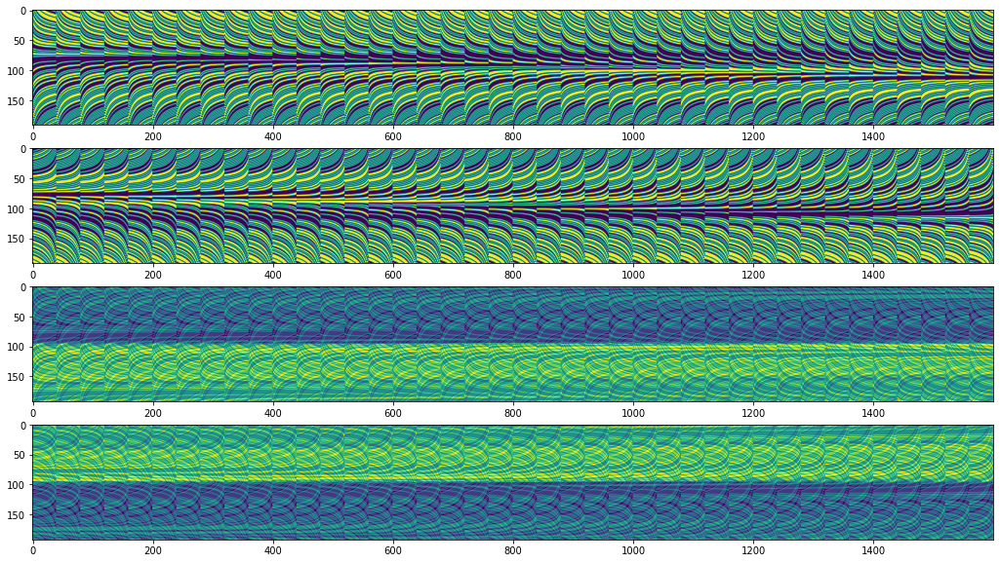

In [ ]:
# Small scale rotated forward model implementation

H_opp = np.rot90(np.rot90(H)) #opposite direction of H

theta = np.radians(45)
c, s = np.cos(theta), np.sin(theta)
R = np.array(((c, -s), (s, c)))
H45_new = np.reshape(H,(2,153600))
H45 = np.reshape(np.dot(R,H45_new),(192,1600)) # 45 degree forward model
H45_opp = np.rot90(np.rot90(H45)) # 45 deg forward model from opposite direction

plt.subplot(4,1,1)
plt.imshow(H)
plt.subplot(4,1,2)
plt.imshow(H_opp)
plt.subplot(4,1,3)
plt.imshow(H45)
plt.subplot(4,1,4)
plt.imshow(H45_opp)


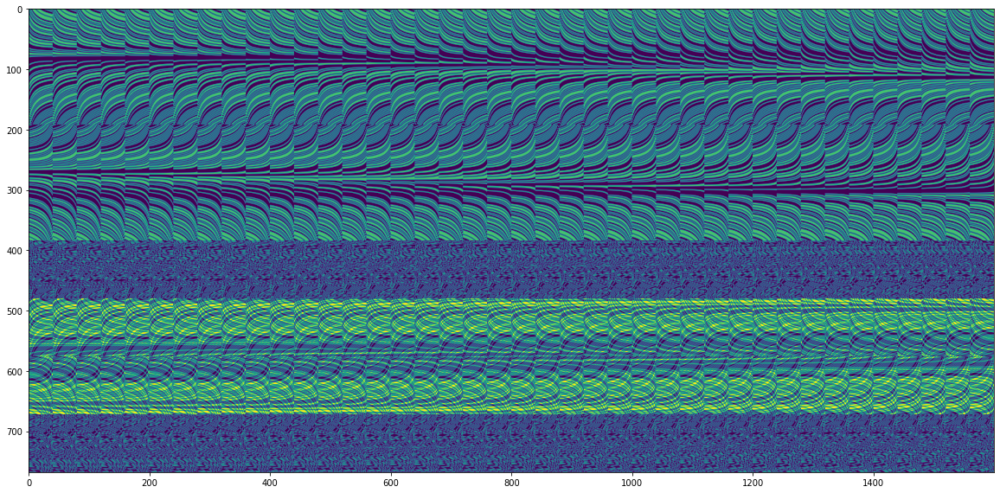

In [ ]:
# Combining all forward models
Htot1= np.concatenate((H, H_opp), axis = 0)
Htot2 = np.concatenate((H, H_opp, H90, H90_opp), axis = 0)
plt.imshow(Htot2)

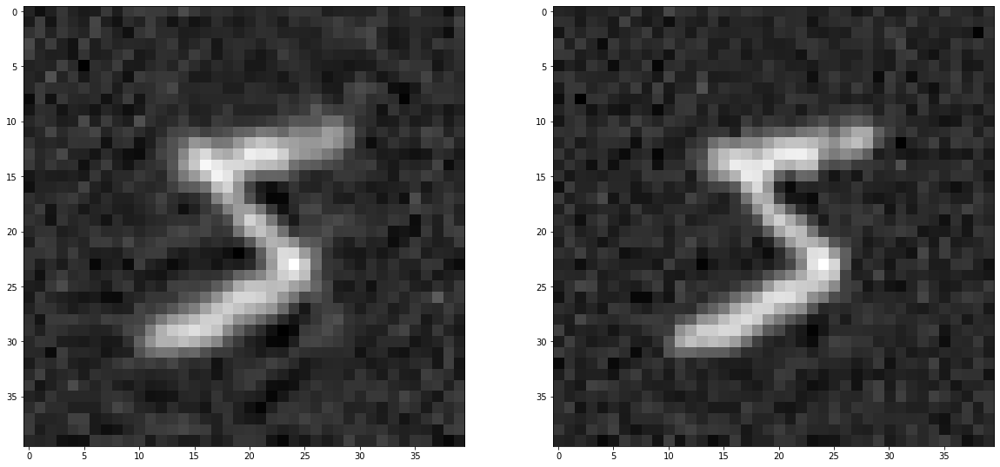

In [ ]:
Hfinal1 = np.reshape(np.matmul(np.linalg.pinv(Htot1),np.matmul(Htot1,np.reshape(x_train[0,:,:],N**2))),(N,N))
Hfinal2 = np.reshape(np.matmul(np.linalg.pinv(Htot2),np.matmul(Htot2,np.reshape(x_train[0,:,:],N**2))),(N,N))

plt.subplot(1,2,1)
plt.imshow(Hfinal1, cmap='gray')
plt.subplot(1,2,2)
plt.imshow(Hfinal2, cmap='gray')

# 2.) Coded Aperture Projection (low complexity object)

After exploring the small scale implementations, we can now apply the methodology full-scale to the dataset of images. Investigating the two approaches above (applying single forward model to rotated images and applying rotated forward models to single images) has shown that the latter may produce the best results. As such, the method of applying rotated forward models will be used to perform coded aperture projection tomography from this point forth in the project. 

(8, 2, 2)
(16, 192, 1600)
(3072, 1600)


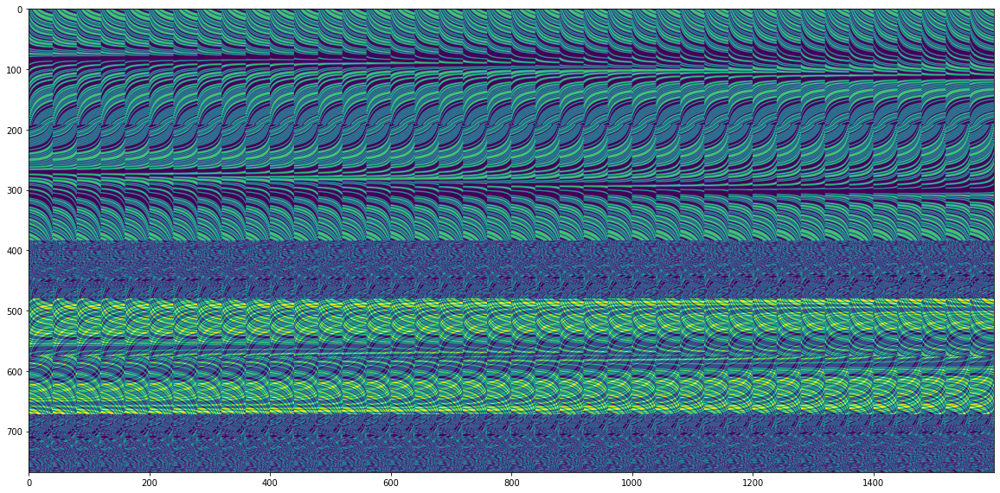

In [ ]:
# Rotated forward models
proj_num = 10         #number of proj angles (try 8, 10, 12, 18, 20, 24, 30, 36)
deg = np.linspace(0,360,proj_num)
rad = np.radians(deg)
R_all = []
H_all = []

for i in range(0,proj_num):
  c, s = np.cos(rad[i]), np.sin(rad[i])
  R = np.array(((c, -s), (s, c))) 
  R_all.append(R)

H_reshape = np.reshape(H,(2,153600))

for i in range(0,proj_num):
  H_theta = np.reshape(np.dot(R_all[i],H_reshape),(192,1600))
  H_theta_opp = np.rot90(np.rot90(H_theta))
  H_all.append(H_theta)
  H_all.append(H_theta_opp)

H_tot = np.zeros(np.shape(H_all))
H_tot = np.abs(np.vstack(H_all))

plt.imshow(H_tot[0:768,:])

print(np.shape(R_all))
print(np.shape(H_all))
print(np.shape(H_tot))

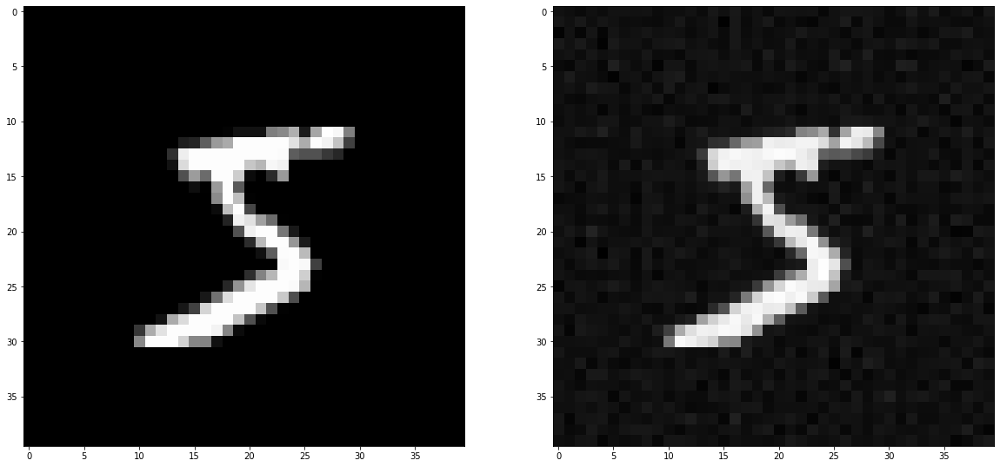

In [ ]:
# Applying to test image
obj = np.reshape(np.matmul(np.linalg.pinv(H_tot),np.matmul(H_tot,np.reshape(x_train[0,:,:],N**2))),(N,N))

plt.subplot(1,2,1)
plt.imshow(x_train[0], cmap = 'gray')
plt.subplot(1,2,2)
plt.imshow(obj, cmap = 'gray')

We have found from this test that for a simple object as above, only 10 projections are necessary to fully recover the original object. For 8 projections, we obtain only a slight amount of noise in the background, but the object is still very distinguishable, and almost an exact reconstruction of the original. I had intended to perform neural denoising on these projections to remove any residual artifacts, but it seems it is not necessary. Thus, we will now test the process on a more natural set of images and examine the performance. 

# 3.) Coded Aperture Projection (high complexity object)

I will be using diffusion weighted magnetic resonance images of rat brains which I have obtained from a current research project exploring effects of hypertension on micro-structures in the brain. While there may not be a need for coded aperture imaging in the field of magnetic resonance as compared to X-ray tomography or nuclear imaging (to reduce radiation exposure), these MR images are what I have on hand, and may act as a stand-in for a set of x-ray images as we are only really focused on object complexity at this point in time.  Let's see if we can clean up these images, and maybe attempt to create a 3D model from a number of brain image slices. 

## Load and Prep Data

In [ ]:
import nibabel as nib

# !! Run this only if loading a new dataset of brains
# !! Previously loaded / prepped brains are below

# loading in NIFTI images and extracting axial volumes
brain = nib.load('rat10150_pre_dwi_DMC.nii')
brain = np.array(brain.dataobj)
brain = np.rot90(np.rot90(np.rot90(brain)))

plt.rcParams['figure.figsize'] = [20,10]
plt.subplot(2,4,1)
plt.imshow(brain[:,:,40], cmap = 'gray')
plt.subplot(2,4,2)
plt.imshow(brain[:,:,50], cmap = 'gray')
plt.subplot(2,4,3)
plt.imshow(brain[:,:,60], cmap = 'gray')
plt.subplot(2,4,4)
plt.imshow(brain[:,:,70], cmap = 'gray')

# Crop images so brain is roughly centered and is a smaller data size for processing
# We are only really interested in the brain mass, so we can crop the bottom portion

brain2 = np.zeros((64,64,120))
brain2[:,:,:] = brain[0:64,20:84,:,1]

plt.subplot(2,4,5)
plt.imshow(brain2[:,:,40], cmap = 'gray')
plt.subplot(2,4,6)
plt.imshow(brain2[:,:,50], cmap = 'gray')
plt.subplot(2,4,7)
plt.imshow(brain2[:,:,60], cmap = 'gray')
plt.subplot(2,4,8)
plt.imshow(brain2[:,:,70], cmap = 'gray')

(64, 64, 120)


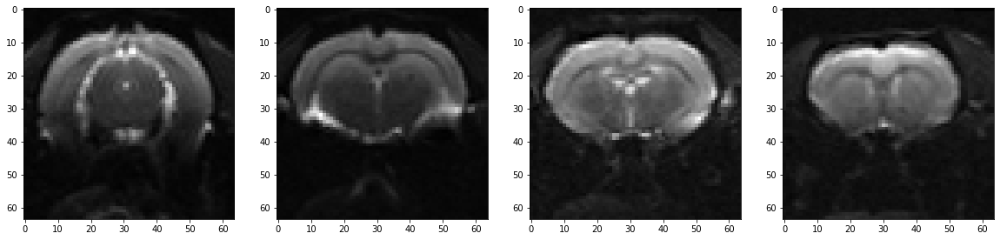

In [ ]:
# Loading and displaying previously prepped brain data 
brain2 = np.load('brainImgs.npy')

plt.rcParams['figure.figsize'] = [20,10]
plt.subplot(1,4,1)
plt.imshow(brain2[:,:,40], cmap = 'gray')
plt.subplot(1,4,2)
plt.imshow(brain2[:,:,50], cmap = 'gray')
plt.subplot(1,4,3)
plt.imshow(brain2[:,:,60], cmap = 'gray')
plt.subplot(1,4,4)
plt.imshow(brain2[:,:,70], cmap = 'gray')
print(np.shape(brain2))

## Create Aperture and Initial Forward Model

In [ ]:
# !! Run this only if generating new H model
# !! Previously generated model loaded below

# Creating the forward model, H
# NOTE: l is object distance from the coded aperture in waves, delta is the 
#       spacing between object elements, d is the distance from the detector,
#       N is the size of our square test image, M is the length of the coded
#       aperture & height of the forward model matrix

l= 10
delta=1
N=64
M=220
pbar1 = ProgressBar()

code=np.random.randint(0,2,M)
def t(x):
  t=code[np.int(np.floor((x+M/2)/delta))]
  return t
vt=np.vectorize(t)
def p(j):
  xj, yj=delta*divmod(j,N)
  xj=xj-N*delta/2
  yj=yj+l
  return xj, yj
def g(j,x):
  g=t((x+(l/p(j)[1])*p(j)[0])/(1+(l/p(j)[1])))
  return g
def h(i,j):
  h=integrate.quad(lambda x: g(j,x), (i-M/2)*delta-delta/2,(i-M/2)*delta +delta/2)[0]
  return h
H=np.zeros((M,N**2))

for j in pbar1(range(N**2)):
  for i in range(M):
    H[i,j]=h(i,j)

100% (4096 of 4096) |####################| Elapsed Time: 0:14:08 Time:  0:14:08


In [ ]:
# Saving generated H and coded aperture 
np.save('forwardmodel.npy', H)
np.save('vt.npy', vt)

Text(0.5, 1.0, 'Initial Forward Model, H')

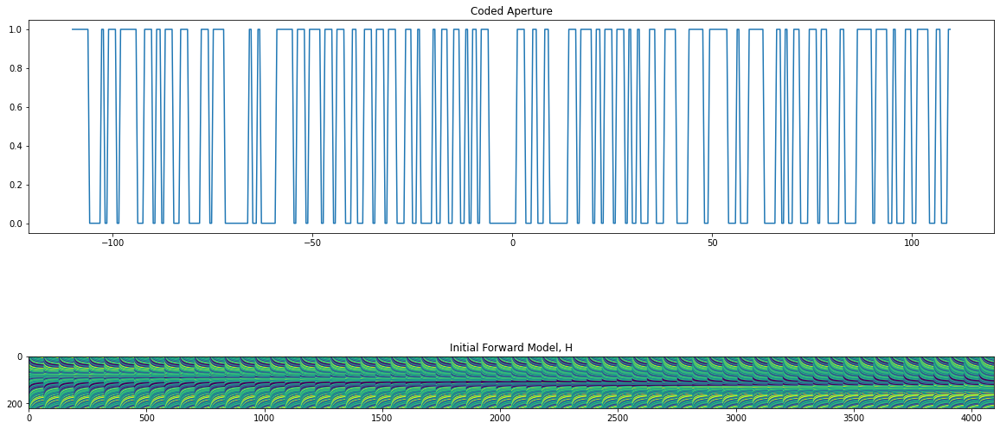

In [ ]:
# Displaying the coded aperture and forward model
xspace = np.linspace(-M*delta/2, (M-1)*delta/2, 512)
plt.rcParams['figure.figsize'] = [20,10]
plt.subplot(2,1,1)
plt.plot(xspace,vt(xspace))
plt.title('Coded Aperture')
plt.subplot(2,1,2)
plt.imshow(H)
plt.title('Initial Forward Model, H')


## Rotated Forward Models

(24, 2, 2)
(48, 220, 4096)
(10560, 4096)


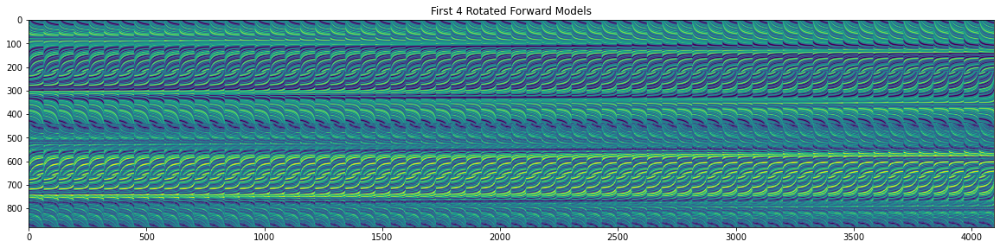

In [ ]:
# Rotated forward models
proj_num = 24         #number of proj angles (try 8, 10, 12, 18, 20, 24, 30, 36)
deg = np.linspace(0,360,proj_num)
rad = np.radians(deg)
R_all = []
H_all = []
M_reshape = int(((N*N)*M)/2)
H_x = N*N

for i in range(0,proj_num):
  c, s = np.cos(rad[i]), np.sin(rad[i])
  R = np.array(((c, -s), (s, c))) 
  R_all.append(R)

H_reshape = np.reshape(H,(2,M_reshape))

for i in range(0,proj_num):
  H_theta = np.reshape(np.dot(R_all[i],H_reshape),(M,H_x))
  H_theta_opp = np.rot90(np.rot90(H_theta))
  H_all.append(H_theta)
  H_all.append(H_theta_opp)

H_tot = np.zeros(np.shape(H_all))
H_tot = np.abs(np.vstack(H_all))

plt.imshow(H_tot[0:880,:])
plt.title('First 4 Rotated Forward Models')

print(np.shape(R_all))
print(np.shape(H_all))
print(np.shape(H_tot))

## Implementation

Text(0.5, 1.0, '24 Projections')

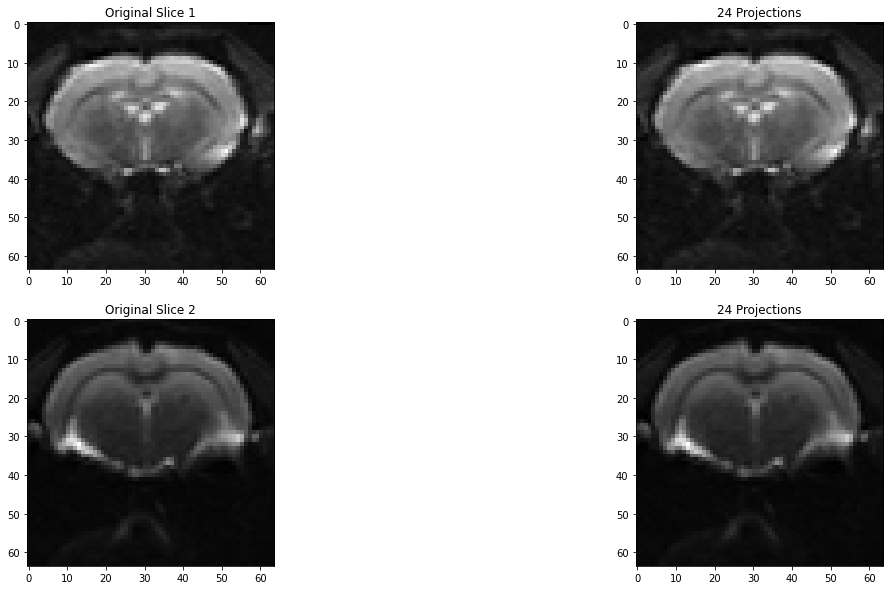

In [ ]:
# Applying to test image
brain24 = np.reshape(np.matmul(np.linalg.pinv(H_tot),np.matmul(H_tot,np.reshape(brain2[:,:,60],N**2))),(N,N))
brain24_2 = np.reshape(np.matmul(np.linalg.pinv(H_tot),np.matmul(H_tot,np.reshape(brain2[:,:,50],N**2))),(N,N))

plt.subplot(2,2,1)
plt.imshow(brain2[:,:,60], cmap = 'gray')
plt.title('Original Slice 1')
plt.subplot(2,2,2)
plt.imshow(brain24, cmap = 'gray')
plt.title('24 Projections')
plt.subplot(2,2,3)
plt.imshow(brain2[:,:,50], cmap = 'gray')
plt.title('Original Slice 2')
plt.subplot(2,2,4)
plt.imshow(brain24_2, cmap = 'gray')
plt.title('24 Projections')

Text(0.5, 1.0, '100 Projections')

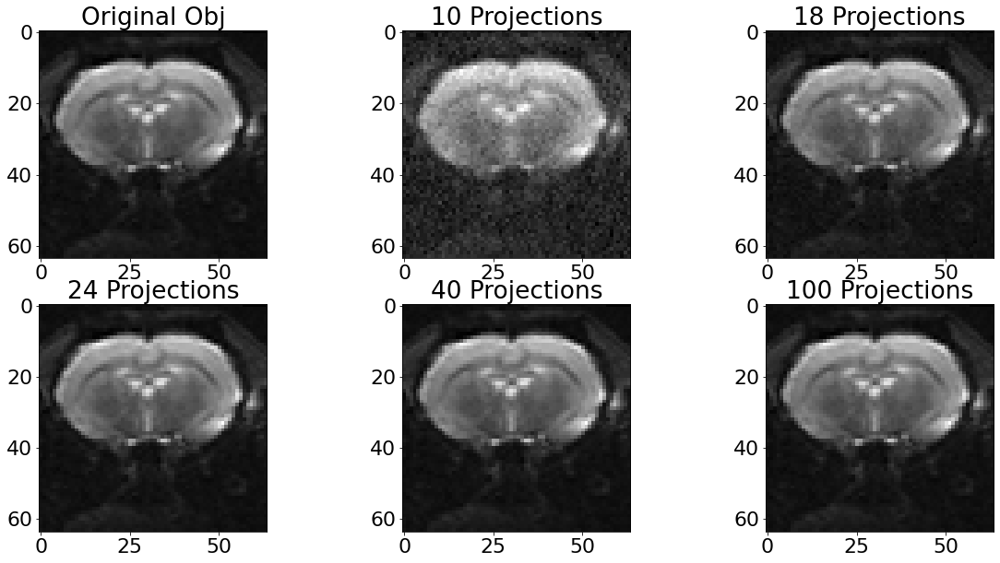

In [ ]:
brain10 = np.load('brain_10proj.npy')
brain18 = np.load('brain_18proj.npy')
brain24 = np.load('brain_24proj.npy')
brain40 = np.load('brain_40proj.npy')
brain100 =np.load('brain_100proj.npy')

plt.subplot(2,3,1)
plt.imshow(brain2[:,:,60], cmap = 'gray')
plt.title('Original Obj')
plt.subplot(2,3,2)
plt.imshow(brain10, cmap = 'gray')
plt.title('10 Projections')
plt.subplot(2,3,3)
plt.imshow(brain18, cmap = 'gray')
plt.title('18 Projections')
plt.subplot(2,3,4)
plt.imshow(brain24, cmap = 'gray')
plt.title('24 Projections')
plt.subplot(2,3,5)
plt.imshow(brain40, cmap = 'gray')
plt.title('40 Projections')
plt.subplot(2,3,6)
plt.imshow(brain100, cmap = 'gray')
plt.title('100 Projections')


In [ ]:
# Calculating Mean Square Error between reconstructions and original
MSE10 = np.square(np.subtract(brain2[:,:,60],brain10)).mean()
MSE18 = np.square(np.subtract(brain2[:,:,60],brain18)).mean()
MSE24 = np.square(np.subtract(brain2[:,:,60],brain24)).mean()
MSE40 = np.square(np.subtract(brain2[:,:,60],brain40)).mean()
MSE100 = np.square(np.subtract(brain2[:,:,60],brain100)).mean()

print("Mean square error for 10 projections:",MSE10)
print("Mean square error for 18 projections:", MSE18)
print("Mean square error for 24 projections:", MSE24)
print("Mean square error for 40 projections:", MSE40)
print("Mean square error for 100 projections:", MSE100)

Mean square error for 10 projections: 122404.09938530391
Mean square error for 18 projections: 9147.416899023792
Mean square error for 24 projections: 3.3867214952916605e-16
Mean square error for 40 projections: 1.4286078181790706e-16
Mean square error for 100 projections: 4.3216450047034045e-17


We can see that for this more natural object, an increased number of projections are needed to reproduce the original. This was as expected, but what is surprising, is that only 24 projections were necessary to obtain almost zero mean square error between the reconstruction and original object (I had predicted maybe around 100 projections would be needed). The small image size certainly helps in this case, and I predict that more projections would be needed for larger objects with a greater number of elements. 100 projections of this one test image took about six minutes of run time to apply the concatenated forward models to the test image and reconstruct the object. 

# 4.) Feature Extraction (Testing)

In this portion of the project, I will attempt feature extraction of the central brain mass. We will implement a methodology by which we may obtain a binary mask of the central brain mass, which will then be multiplied by the orignal image to extract that desired portion. Once this is done, further analyses may be perfomed such as slice co-registration and 3D visualization of the mass. 

It should be noted that from this point forth, I will not be using the resulting projection reconstuctions that were obtained. As we had previously discovered, 24 projections resulted in a measn square error of roughly zero between the original object and recontructed projection. As the reconstructions took about 1.5 minutes per slice of brain, I would like to cut down the run time of the forthcoming tests by using the orignal images. While one may certainly be able to use the obtained reconstructions, this is simply being done for experimental purposes and further implementations are performed as more of a proof-of-concept. 

I will attempt to implement anisotropic diffusion filtering to first identify the anatomical boundaries separating the central brain mass from surrounding tissues. Anisotropic diffusion is beneficial as it removes noise from digital images while maintaining the integrity of feature edges. After this, a Marr-Hildredth edge detection algorithm is implemented, and automatic thresholding is performed on the resulting Laplacian images to remove unwanted features. Erode/dilate cycles will then be applied to generate a final binary mask for the slice. 

The methodology implemented here is an interpretation of that used in "Magnetic Resonance Image Tissue Classification Using Partial Volume Model" by David W. Shattuck et al. 

Shattuck DW, Sandor-Leahy SR, Schaper KA, Rottenberg DA, Leahy RM. Magnetic resonance image tissue classification using a partial volume model. NeuroImage. 2001;13(5):856–876. doi: 10.1006/nimg.2000.0730.

https://www.sciencedirect.com/science/article/abs/pii/S1053811900907304

## Anisotropic Diffusion

In [ ]:
# Anisotropic Diffusion function below gathered from Peter Kovesi 
# https://pastebin.com/sBsPX4Y7

def anisodiff(img,niter=1,kappa=50,gamma=0.1,step=(1.,1.),option=1,ploton=False):
  if img.ndim == 3:
        warnings.warn("Only grayscale images allowed, converting to 2D matrix")
        img = img.mean(2)
 
    # initialize output array
  img = img.astype('float32')
  imgout = img.copy()
 
  # initialize some internal variables
  deltaS = np.zeros_like(imgout)
  deltaE = deltaS.copy()
  NS = deltaS.copy()
  EW = deltaS.copy()
  gS = np.ones_like(imgout)
  gE = gS.copy()
 
  # create the plot figure, if requested
  if ploton:
      import pylab as pl
      from time import sleep
      fig = pl.figure(figsize=(20,5.5),num="Anisotropic diffusion")
      ax1,ax2 = fig.add_subplot(1,2,1),fig.add_subplot(1,2,2)
 
      ax1.imshow(img,interpolation='nearest', cmap = 'gray')
      ih = ax2.imshow(imgout,interpolation='nearest',animated=True, cmap = 'gray')        
      ax1.set_title("Original image")
      ax2.set_title("Iteration 0")
      fig.canvas.draw()
 
  for ii in range(niter):
      # calculate the diffs
      deltaS[:-1,: ] = np.diff(imgout,axis=0)
      deltaE[: ,:-1] = np.diff(imgout,axis=1)
 
      # conduction gradients (only need to compute one per dim!)
      if option == 1:
          gS = np.exp(-(deltaS/kappa)**2.)/step[0]
          gE = np.exp(-(deltaE/kappa)**2.)/step[1]
      elif option == 2:
          gS = 1./(1.+(deltaS/kappa)**2.)/step[0]
          gE = 1./(1.+(deltaE/kappa)**2.)/step[1]
 
      # update matrices
      E = gE*deltaE
      S = gS*deltaS
 
      # subtract a copy that has been shifted 'North/West' by one
      # pixel. don't as questions. just do it. trust me.
      NS[:] = S
      EW[:] = E
      NS[1:,:] -= S[:-1,:]
      EW[:,1:] -= E[:,:-1]
 
      # update the image
      imgout += gamma*(NS+EW)
 
      if ploton:
          iterstring = "Iteration %i" %(ii+1)
          ih.set_data(imgout)
          ax2.set_title(iterstring)
          fig.canvas.draw()
           # sleep(0.01)
 
  return imgout


3236083.424790389


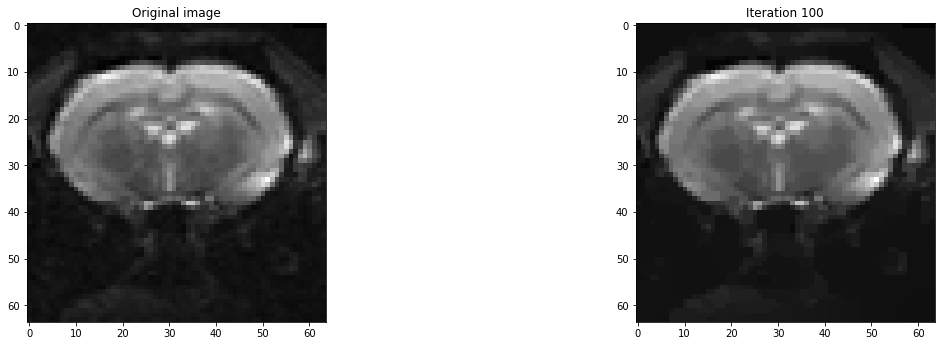

In [ ]:
brain1_andiff = anisodiff(brain24, niter = 100, kappa = 20, gamma = 0.2, step=(1.,1.), option=2, ploton = True)
#brain2_andiff = anisodiff(brain24_2, niter = 500, kappa = 20, gamma = 0.2, step=(1.,1.), option=2, ploton = True)
MSE24 = np.square(np.subtract(brain2[:,:,50],brain1_andiff)).mean()
print(MSE24)

As we can see in the images below, an increasing number of iterations greatly reduces the amount of noise and lowers the intensity of surrounding features. Continuing on, 300 iterations will be used, as 500 iterations smooths the image a bit more than we would like. The most difficult task moving forward is ensuring that the trigeminal nerve (located below the brain in the top row) will be extracted, as we do not want this included in the final brain mask.

Text(0.5, 1.0, '500 it. Aniso Diff')

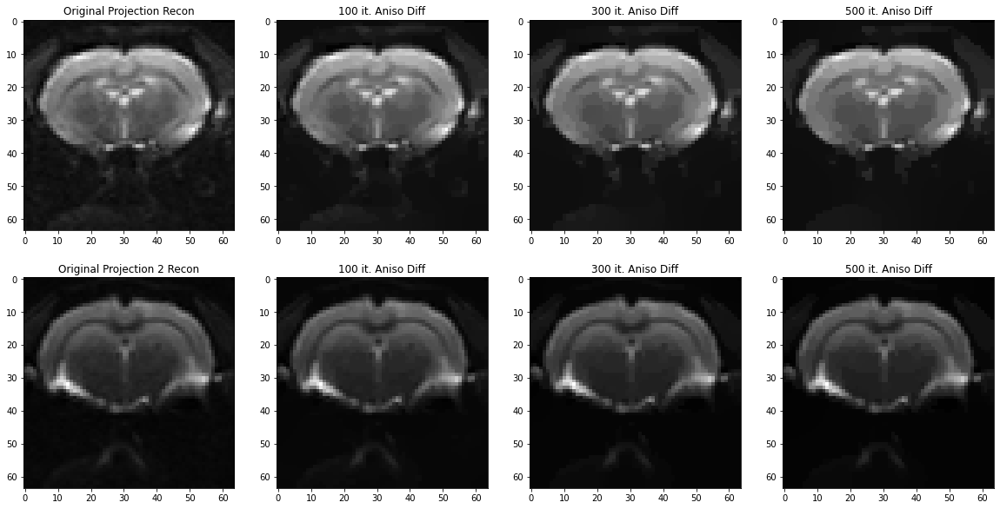

In [ ]:
# Plotting results of anisptropic diffusion for number of iterations
aniso100 = np.load('100it_anisoDiff.npy')
aniso300 = np.load('300it_anisoDiff.npy')
aniso500 = np.load('500it_anisoDiff.npy')
aniso100_2 = np.load('100it2.npy')
aniso300_2 = np.load('300it2.npy')
aniso500_2 = np.load('500it2.npy')

plt.subplot(2,4,1)
plt.imshow(brain24, cmap = 'gray')
plt.title('Original Projection Recon')
plt.subplot(2,4,2)
plt.imshow(aniso100, cmap = 'gray')
plt.title('100 it. Aniso Diff')
plt.subplot(2,4,3)
plt.imshow(aniso300, cmap = 'gray')
plt.title('300 it. Aniso Diff')
plt.subplot(2,4,4)
plt.imshow(aniso500, cmap = 'gray')
plt.title('500 it. Aniso Diff')
plt.subplot(2,4,5)
plt.imshow(brain24_2, cmap = 'gray')
plt.title('Original Projection 2 Recon')
plt.subplot(2,4,6)
plt.imshow(aniso100_2, cmap = 'gray')
plt.title('100 it. Aniso Diff')
plt.subplot(2,4,7)
plt.imshow(aniso300_2, cmap = 'gray')
plt.title('300 it. Aniso Diff')
plt.subplot(2,4,8)
plt.imshow(aniso500_2, cmap = 'gray')
plt.title('500 it. Aniso Diff')

## Marr-Hildreth Edge-Detection

We continue on to perform edge detection, implementing the Marr-Hildreth edge detector based on low-pass filtering with a symmetric Gaussian kernel, then further processed by locating zero-crossings in the Lapacian. 

In [ ]:
# https://github.com/adl1995/edge-detectors/blob/master/marr-hildreth-edge.py
__author__ = "Adeel Ahmad"
__email__ = "adeelahmad14@hotmail.com"

import argparse
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt

from skimage import color
from mpl_toolkits.mplot3d import Axes3D


def edgesMarrHildreth(img, sigma):
    """
            finds the edges using MarrHildreth edge detection method...
            :param im : input image
            :param sigma : sigma is the std-deviation and refers to the spread of gaussian
            :return:
            a binary edge image...
    """
    size = int(2*(np.ceil(3*sigma))+1)

    x, y = np.meshgrid(np.arange(-size/2+1, size/2+1),
                       np.arange(-size/2+1, size/2+1))

    normal = 1 / (2.0 * np.pi * sigma**2)

    kernel = ((x**2 + y**2 - (2.0*sigma**2)) / sigma**4) * \
        np.exp(-(x**2+y**2) / (2.0*sigma**2)) / normal  # LoG filter

    kern_size = kernel.shape[0]
    log = np.zeros_like(img, dtype=float)

    # applying filter
    for i in range(img.shape[0]-(kern_size-1)):
        for j in range(img.shape[1]-(kern_size-1)):
            window = img[i:i+kern_size, j:j+kern_size] * kernel
            log[i, j] = np.sum(window)

    log = log.astype(np.int64, copy=False)

    zero_crossing = np.zeros_like(log)

    # computing zero crossing
    for i in range(log.shape[0]-(kern_size-1)):
        for j in range(log.shape[1]-(kern_size-1)):
            if log[i][j] == 0:
                if (log[i][j-1] < 0 and log[i][j+1] > 0) or (log[i][j-1] < 0 and log[i][j+1] < 0) or (log[i-1][j] < 0 and log[i+1][j] > 0) or (log[i-1][j] > 0 and log[i+1][j] < 0):
                    zero_crossing[i][j] = 255
            if log[i][j] < 0:
                if (log[i][j-1] > 0) or (log[i][j+1] > 0) or (log[i-1][j] > 0) or (log[i+1][j] > 0):
                    zero_crossing[i][j] = 255

    # plotting images
    #fig = plt.figure()
    #a = fig.add_subplot(1, 2, 1)
    #imgplot = plt.imshow(log, cmap='gray')
    #a.set_title('Laplacian of Gaussian')
    #a = fig.add_subplot(1, 2, 2)
    #imgplot = plt.imshow(zero_crossing, cmap='gray')
    #string = 'Zero Crossing sigma = '
    #string += (str(sigma))
    #a.set_title(string)
    #plt.show()

    return log, zero_crossing

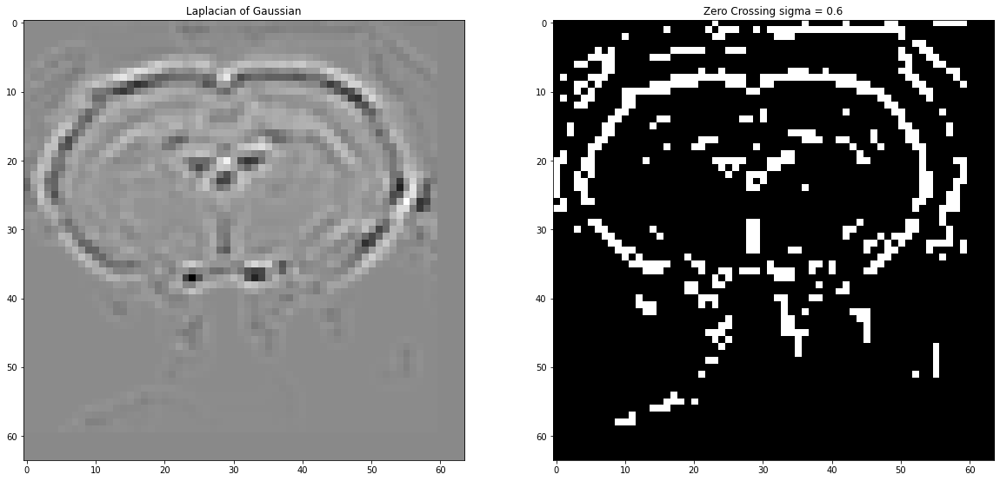

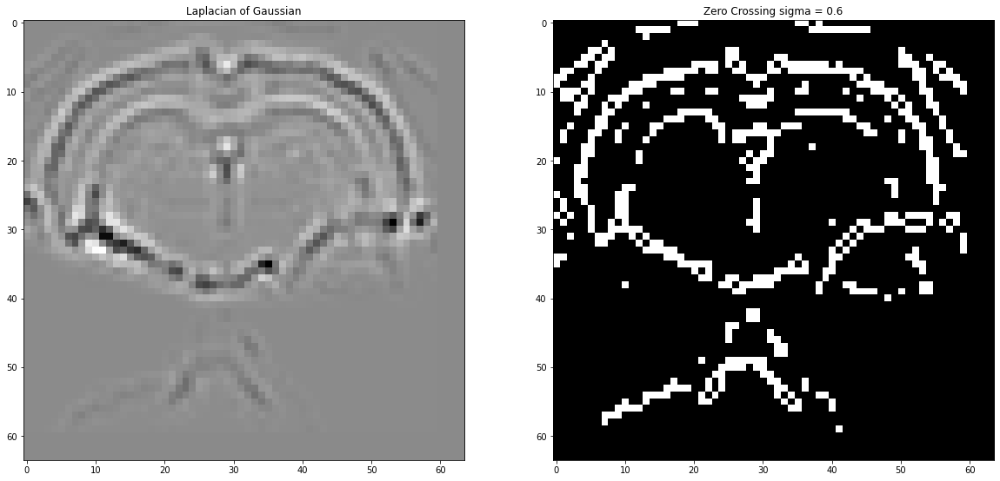

In [ ]:
edgeMap1 = edgesMarrHildreth(aniso300, 0.6)
edgeMap2 = edgesMarrHildreth(aniso300_2, 0.6)

np.save('edge1_8', edgeMap1)
np.save('edge2_8', edgeMap2)

In [ ]:
# Plotting edge maps for various values of sigma 
edge1_6 = np.load('edge1_6.npy')
edge2_6 = np.load('edge2_6.npy')
edge1_7 = np.load('edge1_7.npy')
edge2_7 = np.load('edge2_7.npy')
edge1_8 = np.load('edge1_8.npy')
edge2_8 = np.load('edge2_8.npy')

plt.subplot(2,4,1)
plt.imshow(aniso300, cmap = 'gray')
plt.title('AnsiDiff 300 it ')
plt.subplot(2,4,2)
plt.imshow(edge1_6[0], cmap = 'gray')
plt.title('Sigma = 0.6')
plt.subplot(2,4,3)
plt.imshow(edge1_7[0], cmap = 'gray')
plt.title('Sigma = 0.7')
plt.subplot(2,4,4)
plt.imshow(edge1_8[0], cmap = 'gray')
plt.title('Sigma = 0.8')
plt.subplot(2,4,5)
plt.imshow(aniso300_2, cmap = 'gray')
plt.title('AnsiDiff 300 it ')
plt.subplot(2,4,6)
plt.imshow(edge2_6[0], cmap = 'gray')
plt.title('Sigma = 0.6')
plt.subplot(2,4,7)
plt.imshow(edge2_7[0], cmap = 'gray')
plt.title('Sigma = 0.7')
plt.subplot(2,4,8)
plt.imshow(edge2_8[0], cmap = 'gray')
plt.title('Sigma = 0.8')

## Thresholding & Mask Generation

The edge map output from using the Marr-Hildreth algorithm is not as clean as we would like. As such, we go ahead and visualize a cross-section of the output Laplacian from our edge-detection approach (a quick & dirty a "histogram"). We can see a relative plot of pixel intensities across the center of the image, and deduce an initial threshold to apply to the image. The is implemented further below. 

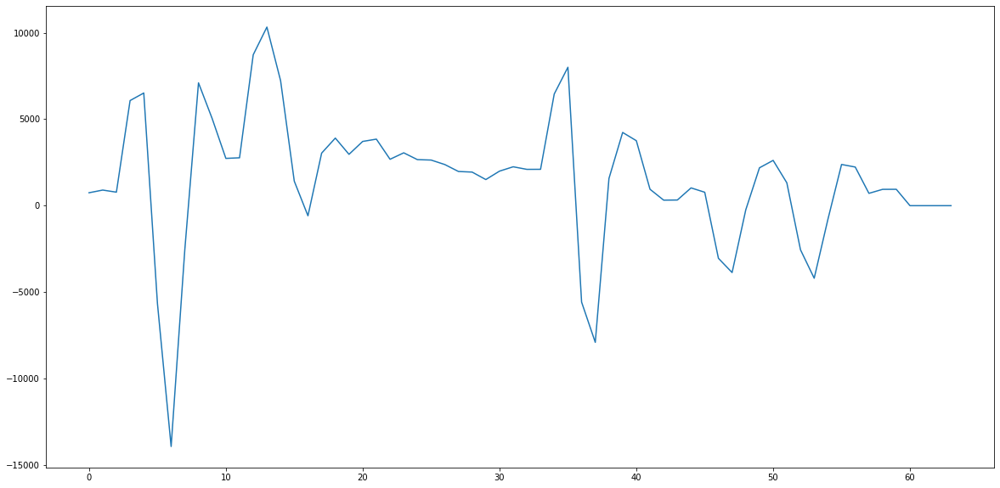

In [ ]:
plt.plot(edge2_6[0,:,32])

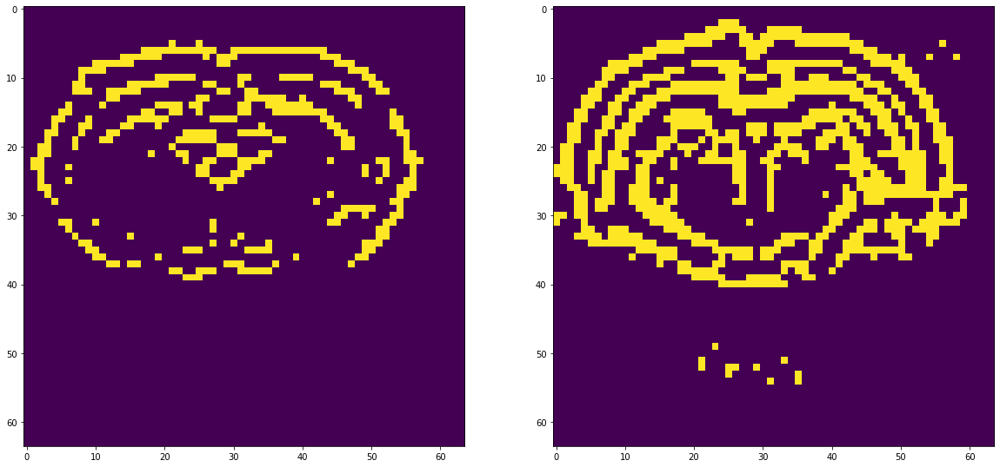

In [ ]:
im_bin1 = (edge1_6[0] > 4000) * 255
im_bin2 = (edge2_6[0] > 3000) * 255

plt.subplot(1,2,1)
plt.imshow(im_bin1)
plt.subplot(1,2,2)
plt.imshow(im_bin2)

In [ ]:
import scipy
from PIL import Image, ImageFilter
#image = image.filter(ImageFilter.ModeFilter(size=13))
#fill1 = scipy.ndimage.morphology.binary_fill_holes(dilate1)


kernel = np.ones((2,2), np.uint8)
im_bin1 = np.uint8(im_bin1)
im_bin1 = cv2.dilate(im_bin1, kernel, iterations =3)
dilate1 = cv2.erode(im_bin1, kernel, iterations = 2)

fill1 = scipy.ndimage.morphology.binary_fill_holes(dilate1)
final1 = cv2.erode(np.float32(fill1), kernel, iterations = 4)
#final1 = scipy.ndimage.morphology.binary_fill_holes(dilate2)


#image = image.filter(ImageFilter.ModeFilter(size=13))

im_bin2 = np.uint8(im_bin2)
dilate1_2 = cv2.dilate(im_bin2, kernel, iterations = 3)
erode1_2 = cv2.erode(dilate1_2, kernel, iterations = 3)
dilate2_2 = cv2.dilate(erode1_2, kernel, iterations = 1)
final1_2 = scipy.ndimage.morphology.binary_fill_holes(dilate2_2)

plt.subplot(2,4,1)
plt.imshow(im_bin1)
plt.subplot(2,4,2)
plt.imshow(dilate1)
plt.subplot(2,4,3)
plt.imshow(fill1)
plt.subplot(2,4,4)
plt.imshow(final1)
plt.subplot(2,4,5)
plt.imshow(dilate1_2)
plt.subplot(2,4,6)
plt.imshow(erode1_2)
plt.subplot(2,4,7)
plt.imshow(dilate2_2)
plt.subplot(2,4,8)
plt.imshow(final1_2)

Below we display a quick demonstration of intermediate results. Moving forward, we will apply the methodology to all brain slices in the axial plane. As opposed to manual thresholding, an adaptive thresholing approach will be used, hopefully providing more desirable results. 

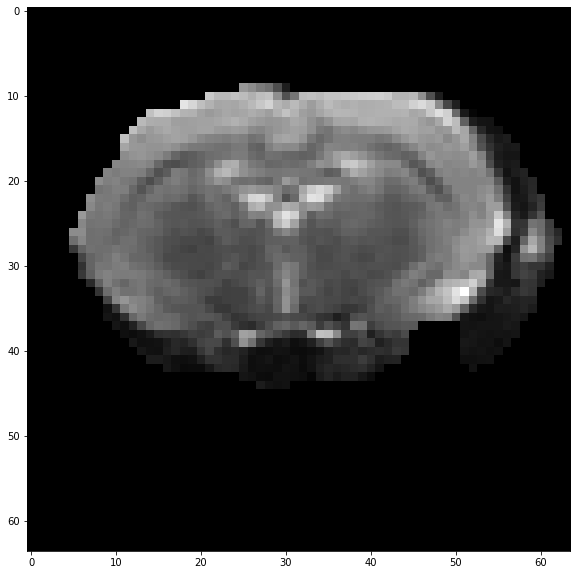

In [ ]:
masked1 = final1 * brain24
plt.imshow(masked1, cmap = 'gray')

# 5.) Feature Extraction (full-volume)

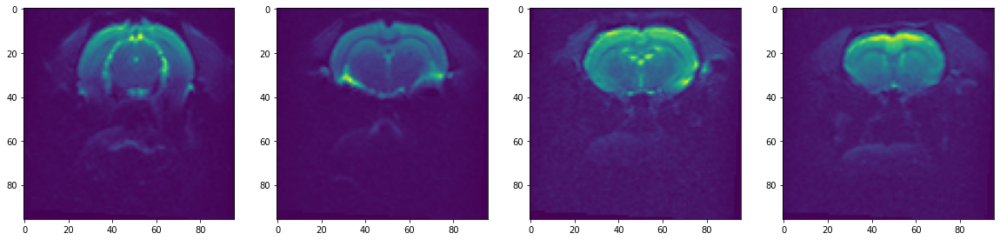

In [215]:
# reload raw axial slice images
import nibabel as nib

brain3 = nib.load('rat10150_pre_dwi_DMC.nii')
brain3 = np.array(brain3.dataobj)
brain3 = np.rot90(np.rot90(np.rot90(brain3)))

slices = brain3[:,:,:,1]
np.save('axial.npy', slices) # saving for future use

# displaying sample slices of uncropped images 
plt.subplot(1,4,1)
plt.imshow(slices[:,:,40])
plt.subplot(1,4,2)
plt.imshow(slices[:,:,50])
plt.subplot(1,4,3)
plt.imshow(slices[:,:,60])
plt.subplot(1,4,4)
plt.imshow(slices[:,:,70])

## Anisotropic Diffusion

Displayed below are the results of four sample axial slices using 300 iterations of anisptropic diffusion (top row is original, bottom row is filtered). 

100% (120 of 120) |######################| Elapsed Time: 0:00:03 Time:  0:00:03


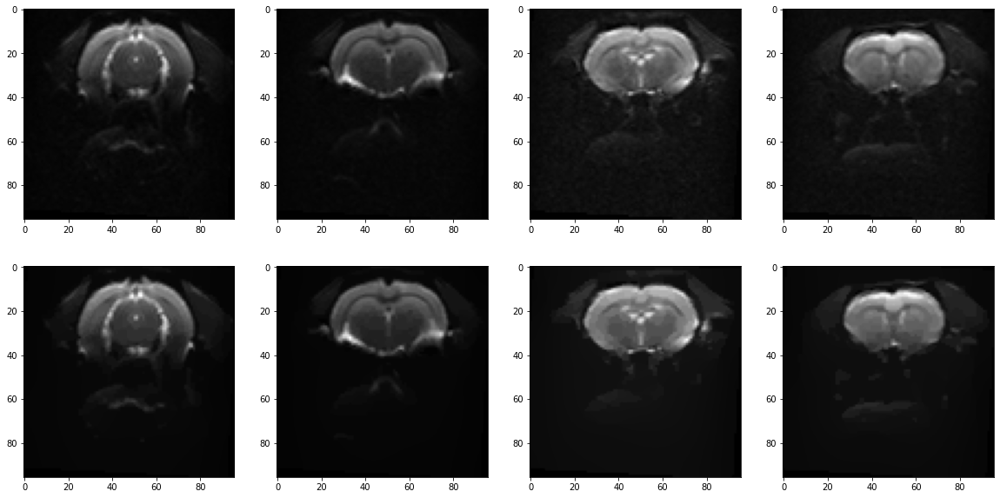

In [216]:
diff = np.zeros(np.shape(slices))
pbar = ProgressBar()

for i in pbar(range(0,np.shape(slices)[2])):
  diff[:,:,i] = anisodiff(slices[:,:,i], niter = 300, kappa = 20, gamma = 0.2, step=(1.,1.), option=2, ploton = False)

plt.subplot(2,4,1)
plt.imshow(slices[:,:,40], cmap = 'gray')
plt.subplot(2,4,2)
plt.imshow(slices[:,:,50], cmap = 'gray')
plt.subplot(2,4,3)
plt.imshow(slices[:,:,60], cmap = 'gray')
plt.subplot(2,4,4)
plt.imshow(slices[:,:,70], cmap = 'gray')
plt.subplot(2,4,5)
plt.imshow(diff[:,:,40], cmap = 'gray')
plt.subplot(2,4,6)
plt.imshow(diff[:,:,50], cmap = 'gray')
plt.subplot(2,4,7)
plt.imshow(diff[:,:,60], cmap = 'gray')
plt.subplot(2,4,8)
plt.imshow(diff[:,:,70], cmap = 'gray')


## Marr-Hildreth Edge-Detection

100% (120 of 120) |######################| Elapsed Time: 0:00:09 Time:  0:00:09


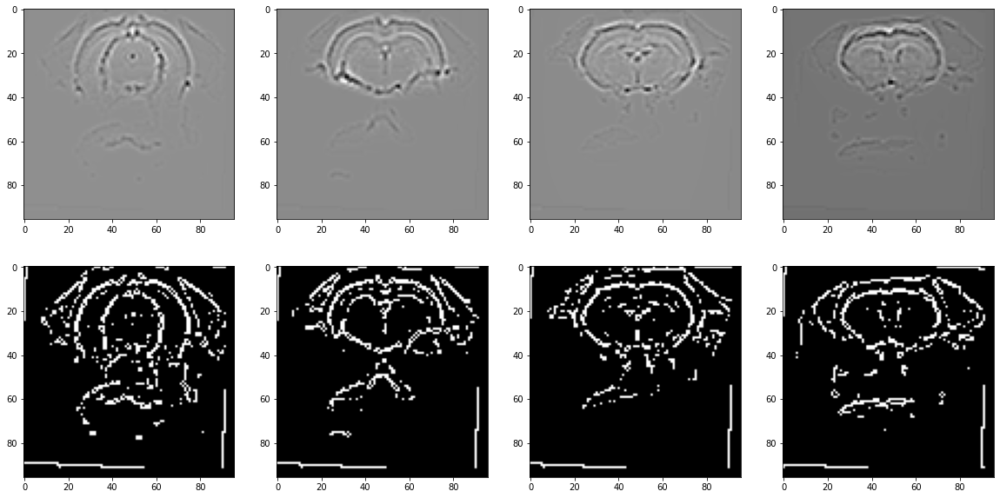

In [217]:
edge_Lap = np.zeros(np.shape(slices))
edge_bin = np.zeros(np.shape(slices))
pbar2 = ProgressBar()

for i in pbar2(range(0,np.shape(slices)[2])):
  curr = edgesMarrHildreth(diff[:,:,i], 0.6)
  edge_Lap[:,:,i] = curr[0]
  edge_bin[:,:,i] = curr[1]

plt.subplot(2,4,1)
plt.imshow(edge_Lap[:,:,40], cmap = 'gray')
plt.subplot(2,4,2)
plt.imshow(edge_Lap[:,:,50], cmap = 'gray')
plt.subplot(2,4,3)
plt.imshow(edge_Lap[:,:,60], cmap = 'gray')
plt.subplot(2,4,4)
plt.imshow(edge_Lap[:,:,70], cmap = 'gray')
plt.subplot(2,4,5)
plt.imshow(edge_bin[:,:,40], cmap = 'gray')
plt.subplot(2,4,6)
plt.imshow(edge_bin[:,:,50], cmap = 'gray')
plt.subplot(2,4,7)
plt.imshow(edge_bin[:,:,60], cmap = 'gray')
plt.subplot(2,4,8)
plt.imshow(edge_bin[:,:,70], cmap = 'gray')


## Thresholding

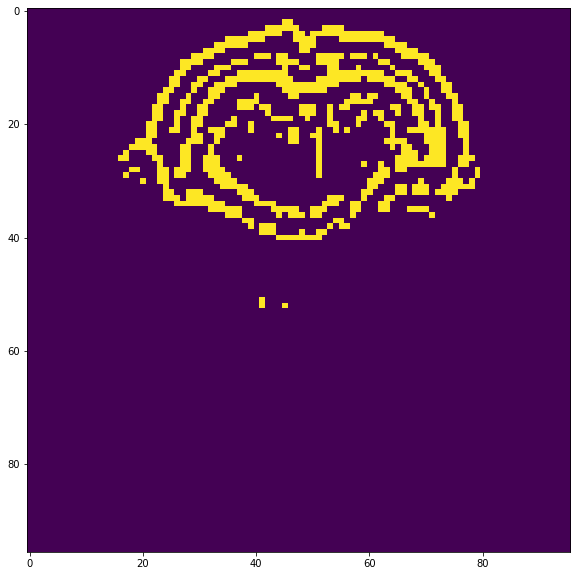

In [225]:
from skimage import data
from skimage.filters import threshold_otsu

binary_adaptive = np.zeros(np.shape(slices))

for i in range(0,np.shape(slices)[2]):
  adaptive_thresh = threshold_otsu(edge_Lap[:,:,i])
  binary_adaptive[:,:,i] = edge_Lap[:,:,i] > adaptive_thresh
  binary_adaptive[:,:,i] = np.uint8(binary_adaptive[:,:,i])

plt.imshow(binary_adaptive[:,:,50])

## Erode / Dilate Cycles

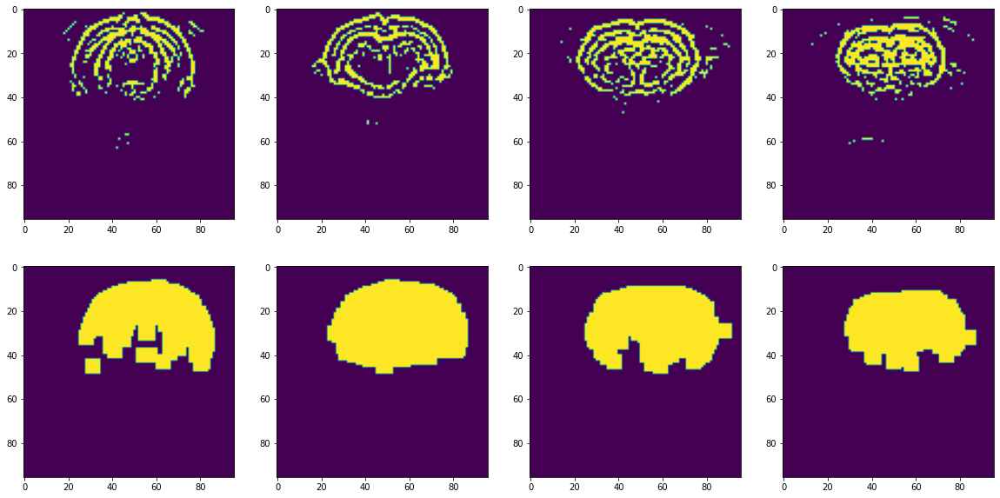

In [326]:
import scipy

kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2,2))
mask = np.zeros(np.shape(slices))

for i in range(0, np.shape(slices)[2]):
  img1 = cv2.erode(binary_adaptive[:,:,i], kernel, iterations = 1)
  img2 = cv2.dilate(img1, kernel, iterations = 3)
  #img3 = cv2.dilate(np.uint8(img2), kernel, iterations = 4)
  img4 = scipy.ndimage.morphology.binary_fill_holes(img2)
  img5 = cv2.erode(np.uint8(img4), kernel, iterations = 3)
  img6 = cv2.dilate(img5, kernel, iterations = 6)
  img7 = scipy.ndimage.morphology.binary_fill_holes(img6)
  mask[:,:,i] = img7[:,:]


plt.subplot(2,4,1)
plt.imshow(binary_adaptive[:,:,40])
plt.subplot(2,4,2)
plt.imshow(binary_adaptive[:,:,50])
plt.subplot(2,4,3)
plt.imshow(binary_adaptive[:,:,60])
plt.subplot(2,4,4)
plt.imshow(binary_adaptive[:,:,70])
plt.subplot(2,4,5)
plt.imshow(mask[:,:,40])
plt.subplot(2,4,6)
plt.imshow(mask[:,:,50])
plt.subplot(2,4,7)
plt.imshow(mask[:,:,60])
plt.subplot(2,4,8)
plt.imshow(mask[:,:,70])

# 6.) RESULTS

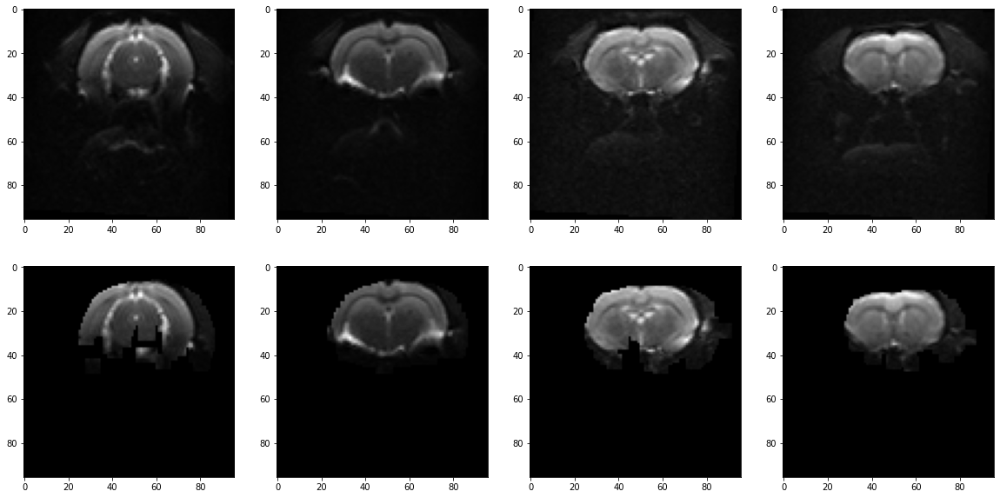

In [327]:
final = np.zeros(np.shape(slices))

for i in range(0, np.shape(slices)[2]):
  final[:,:,i] = slices[:,:,i] * mask[:,:,i]

plt.subplot(2,4,1)
plt.imshow(slices[:,:,40], cmap = 'gray')
plt.subplot(2,4,2)
plt.imshow(slices[:,:,50], cmap = 'gray')
plt.subplot(2,4,3)
plt.imshow(slices[:,:,60], cmap = 'gray')
plt.subplot(2,4,4)
plt.imshow(slices[:,:,70], cmap = 'gray')
plt.subplot(2,4,5)
plt.imshow(final[:,:,40], cmap = 'gray')
plt.subplot(2,4,6)
plt.imshow(final[:,:,50], cmap = 'gray')
plt.subplot(2,4,7)
plt.imshow(final[:,:,60], cmap = 'gray')
plt.subplot(2,4,8)
plt.imshow(final[:,:,70], cmap = 'gray')

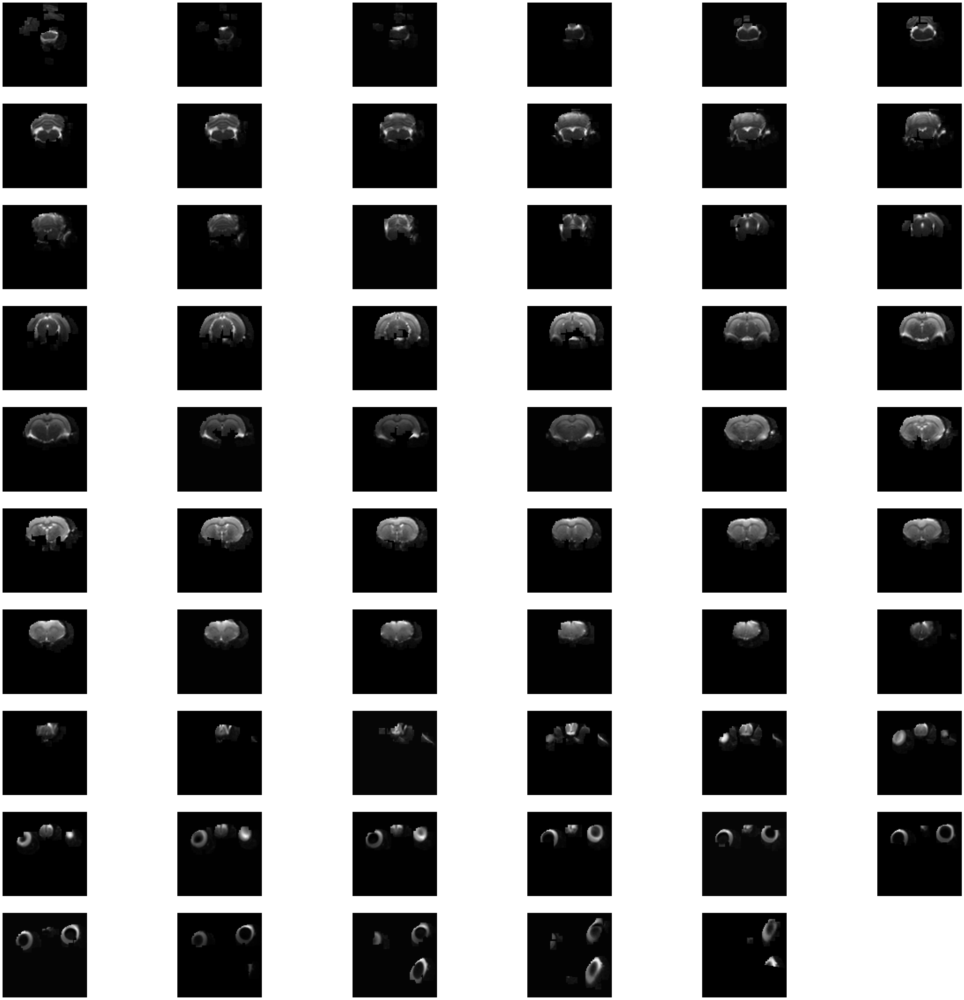

In [346]:
plt.rcParams['figure.figsize'] = [50,50]

for i in range(1,60): 
  plt.subplot(10,6,i)
  plt.imshow(final[:,:,i*2], cmap = 'gray')
  plt.axis('off')


Above we visualize the final extracted brain masses from all sclices in the axial plane. At first glance, it is clear that the masks did not perform as well as would be expected. Erode/dilate cycles are a tricky process to maneuver when dealing with objects such as a living organism's brain shown above. In more simple objects, such as the MNIST datast of handwritten characters, the edges of the main object are clean and definitive; in an object such as this, the various tissues of the brain and surrounding areas have less definitive edges, and are thus harder to extract. 

There exist many packages and functions that may perform better in these scenarios such as a watershed or flood/flood-fill algorithm. In this case shown above, iterations of erode/dilate cycles were chosen and ordered carefully by hand, balancing between the loss of main object data, and removal of outliers. This perfomed well enough, in my mind, that the trigeminal nerves were mostly extracted from the mask, and most of the central brain mass was contained. The main issue faced was maintaining a full, connected mask with no holes (dilating), and trying to balance this with the removal of unwanted outlying features (eroding).

For my own thesis, I intend to continue improving this methodology to eventually create an automated brain-masking procedure that may replace our current process of extracting the brains by hand. I will explore the presence of noise (which may enhance feature edges) and test alternative edge-detection, automated thresholding, and clustering algorithms. This is a task that many have tackled before with infinite procedural approaches. I am confident that with the knowledge I am taking away from this course that I may be zuccessful in accomplishing this, as well. 